# **Market Segmentation**
### **Task done as part of FeyNN Labs Internship**
Analysing the Electric Vehicle market in India using Segmentation analysis for an Electric Vehicles Startup and coming up with a  feasible strategy to enter the market, targeting the segments most likely to use Electric vehicles.
### **Authors:**
*   **Shlok Kumar**

## Step 1: Step 1: Data Loading and Initial Exploration
We'll load the dataset and perform some initial exploration to understand its structure.

### Importing Libraries

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Plotting the clusters in 3D
from mpl_toolkits.mplot3d import Axes3D

#plotting with plotly 3d visualization
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

In [25]:
# Load the data
file_path = 'ev_scooter_data_india_processed.csv'
data = pd.read_csv(file_path)

In [26]:
# Select only the relevant columns
data = data[['Age', 'Marital Status', 'No of Dependents', 'Personal Loan', 'House Loan', 'Wife Working', 'Salary', 'Wife Salary', 'Total Salary']]



In [28]:
# Display the first few rows of the dataset
print("First few rows of the dataset:",data.head())

First few rows of the dataset:    Age  Marital Status  No of Dependents  Personal Loan  House Loan  \
0   58               1                 2              1           1   
1   48               0                 2              0           0   
2   34               0                 4              1           0   
3   27               1                 0              0           1   
4   40               1                 1              0           1   

   Wife Working  Salary  Wife Salary  Total Salary  
0             0   96174            0         96174  
1             0   52431            0         52431  
2             0   47285            0         47285  
3             1   84213       125150        209363  
4             0   62083            0         62083  


In [31]:
# Display the structure of the data
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Age               10000 non-null  int64
 1   Marital Status    10000 non-null  int64
 2   No of Dependents  10000 non-null  int64
 3   Personal Loan     10000 non-null  int64
 4   House Loan        10000 non-null  int64
 5   Wife Working      10000 non-null  int64
 6   Salary            10000 non-null  int64
 7   Wife Salary       10000 non-null  int64
 8   Total Salary      10000 non-null  int64
dtypes: int64(9)
memory usage: 703.2 KB
None


In [32]:
# Display summary statistics
print("\nSummary statistics:")
print(data.describe())


Summary statistics:
                Age  Marital Status  No of Dependents  Personal Loan  \
count  10000.000000    10000.000000      10000.000000   10000.000000   
mean      39.561800        0.616000          2.004300       0.499100   
std       11.454986        0.486382          1.414737       0.500024   
min       20.000000        0.000000          0.000000       0.000000   
25%       30.000000        0.000000          1.000000       0.000000   
50%       40.000000        1.000000          2.000000       0.000000   
75%       49.000000        1.000000          3.000000       1.000000   
max       59.000000        1.000000          4.000000       1.000000   

         House Loan  Wife Working         Salary    Wife Salary   Total Salary  
count  10000.000000  10000.000000   10000.000000   10000.000000   10000.000000  
mean       0.498900      0.302000   95320.631700   25624.402500  120945.034200  
std        0.500024      0.459148   57486.863192   44183.888758   72829.153195  
min   

### Visualizations:

Histogram for each numerical column to understand their distributions.
Count Plot for categorical columns to see the frequency distribution.

### With Matplotlib

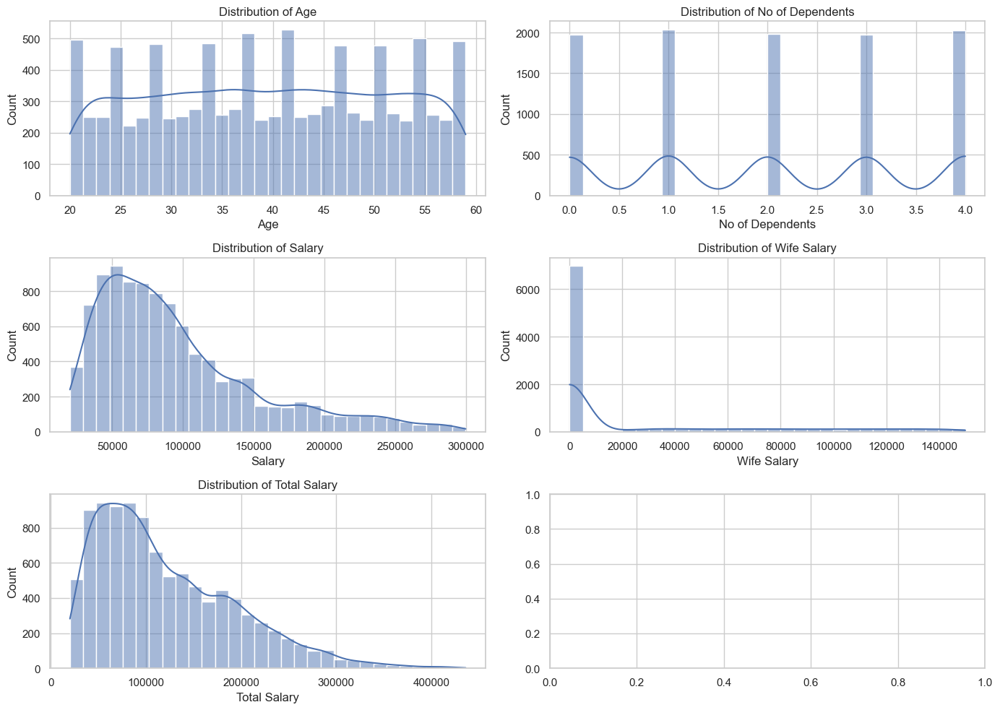

In [33]:
# Set the style for the plots
sns.set(style="whitegrid")

# Plot histograms for numerical columns
num_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(num_cols):
    sns.histplot(data[col], bins=30, ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

### With Ploty for better visualization

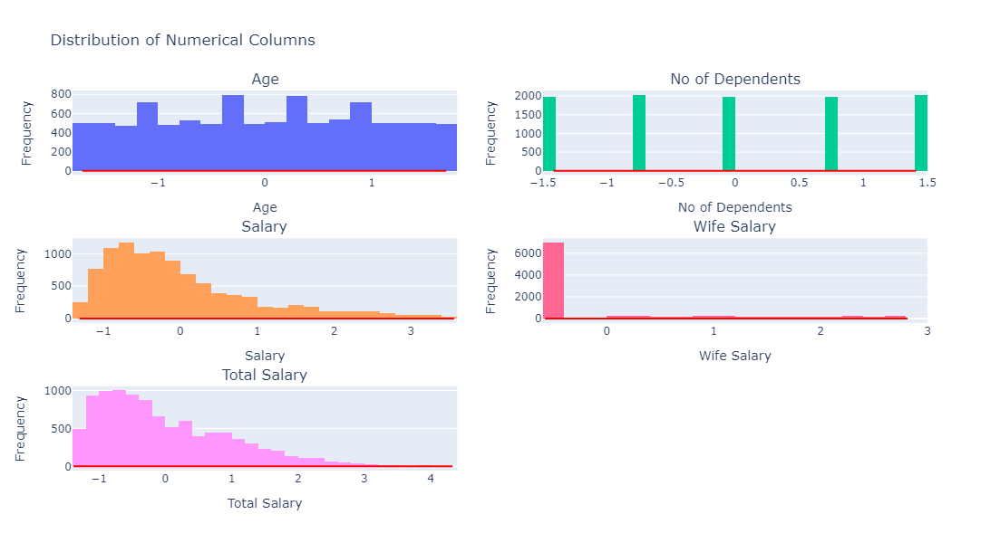

In [72]:
# Set the numerical columns
num_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']

# Create subplots with 3 rows and 2 columns
fig = make_subplots(rows=3, cols=2, subplot_titles=num_cols)

# Iterate over each numerical column
for i, col in enumerate(num_cols):
    row = i // 2 + 1  # Calculate the row index
    col_idx = i % 2 + 1  # Calculate the column index
    
    # Create a histogram for the column
    trace = go.Histogram(x=data[col], nbinsx=30, name=col)
    fig.add_trace(trace, row=row, col=col_idx)
    
    # Update the axis title for each subplot
    fig.update_xaxes(title_text=col, row=row, col=col_idx)
    fig.update_yaxes(title_text='Frequency', row=row, col=col_idx)
    
    # Calculate KDE using scipy
    kde = gaussian_kde(data[col])
    x_range = np.linspace(data[col].min(), data[col].max(), 100)
    kde_values = kde(x_range)
    
    # Add KDE trace for each subplot
    kde_trace = go.Scatter(x=x_range, y=kde_values, mode='lines', name='KDE', line=dict(color='red'))
    fig.add_trace(kde_trace, row=row, col=col_idx)

# Update the layout
fig.update_layout(title='Distribution of Numerical Columns', height=600, width=800,
                  showlegend=False)

# Display the plot
fig.show()

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\1257809040.py:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\1257809040.py:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\1257809040.py:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\1257809040.py:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



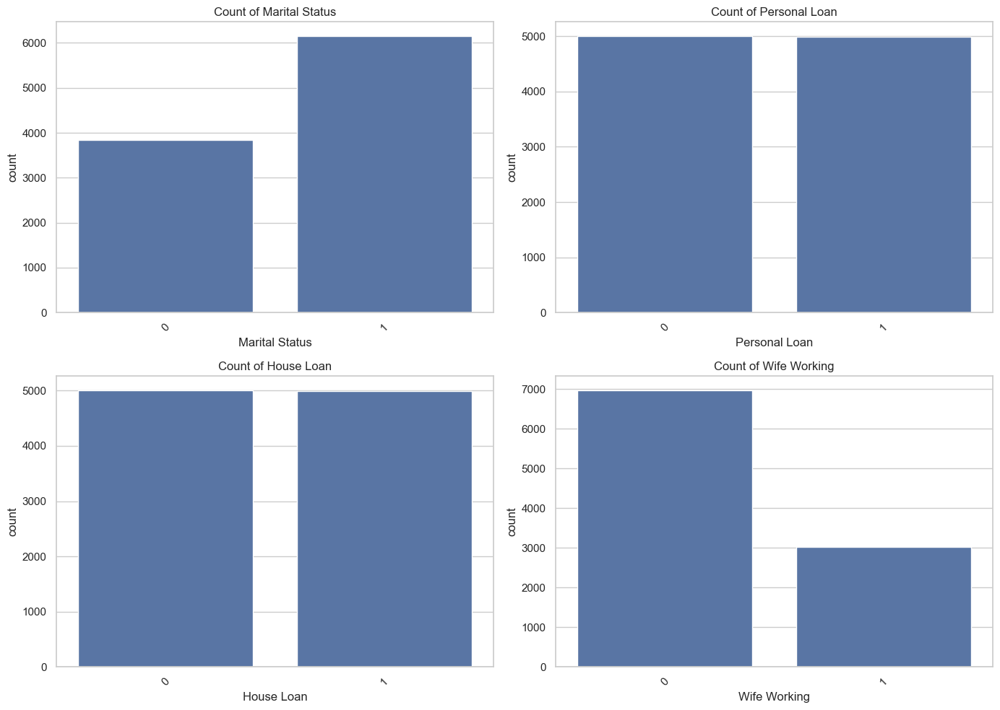

In [34]:
# Plot count plots for categorical columns
cat_cols = ['Marital Status', 'Personal Loan', 'House Loan', 'Wife Working']
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(cat_cols):
    sns.countplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Count of {col}')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()


## Step 2: Data Cleaning and Preparation
We'll check for missing values and handle them if necessary.

In [36]:
# Check for missing values
print("\nMissing values in each column:")
print(data.isnull().sum())
print(data.duplicated())
# Since there are no missing and duplicated values in the dataset, we proceed to the next step.


Missing values in each column:
Age                 0
Marital Status      0
No of Dependents    0
Personal Loan       0
House Loan          0
Wife Working        0
Salary              0
Wife Salary         0
Total Salary        0
dtype: int64
0       False
1       False
2       False
3       False
4       False
        ...  
9995    False
9996    False
9997    False
9998    False
9999    False
Length: 10000, dtype: bool


## Step 3: Manual Encoding of Categorical Variables
Manually encode the categorical variables using pd.replace.

In [73]:
# Define encoding mappings
encoding_maps = {
    'Marital Status': {'Single': 0, 'Married': 1},
    'Personal Loan': {'No': 0, 'Yes': 1},
    'House Loan': {'No': 0, 'Yes': 1},
    'Wife Working': {'No': 0, 'Yes': 1}
}

In [74]:
# Apply the encoding
for col, mapping in encoding_maps.items():
    data[col] = data[col].replace(mapping)

In [75]:
# Display the data after encoding
print("\nData after encoding:")
print(data.head())


Data after encoding:
        Age  Marital Status  No of Dependents  Personal Loan  House Loan  \
0  1.609703               1         -0.003040              1           1   
1  0.736677               0         -0.003040              0           0   
2 -0.485560               0          1.410721              1           0   
3 -1.096678               1         -1.416800              0           1   
4  0.038256               1         -0.709920              0           1   

   Wife Working    Salary  Wife Salary  Total Salary  Cluster  
0             0  0.014845    -0.579978     -0.340142        1  
1             0 -0.746114    -0.579978     -0.940797        1  
2             0 -0.835635    -0.579978     -1.011459        1  
3             1 -0.193230     2.252644      1.214107        0  
4             0 -0.578207    -0.579978     -0.808261        1  


C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\2099500315.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\2099500315.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\2099500315.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shlok\AppData\Local\Temp\ipykernel_23336\2099500315.py:7: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



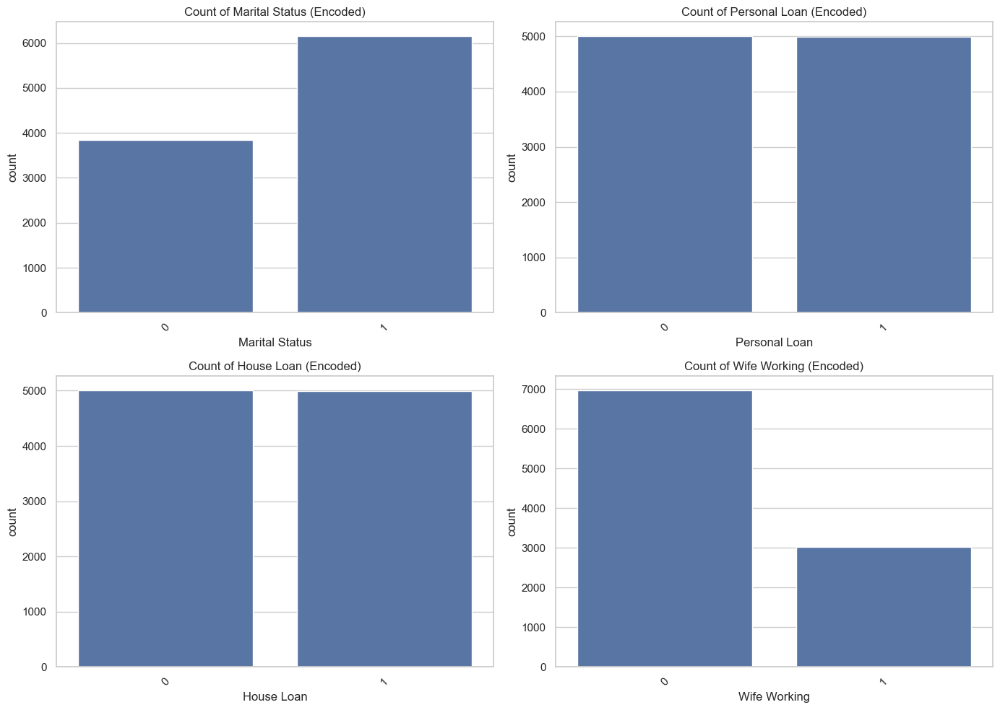

In [76]:
# Plot count plots for encoded categorical columns
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(cat_cols):
    sns.countplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Count of {col} (Encoded)')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

## Step 4: Normalizing Numerical Columns
Normalize the numerical columns to bring them to a similar scale.

In [43]:
# Columns to be normalized
numerical_cols = ['Age', 'No of Dependents', 'Salary', 'Wife Salary', 'Total Salary']

# Normalize numerical columns
scaler = StandardScaler()
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])

# Check the processed data
print("\nProcessed data (after normalization):")
print(data.head())


Processed data (after normalization):
        Age  Marital Status  No of Dependents  Personal Loan  House Loan  \
0  1.609703               1         -0.003040              1           1   
1  0.736677               0         -0.003040              0           0   
2 -0.485560               0          1.410721              1           0   
3 -1.096678               1         -1.416800              0           1   
4  0.038256               1         -0.709920              0           1   

   Wife Working    Salary  Wife Salary  Total Salary  
0             0  0.014845    -0.579978     -0.340142  
1             0 -0.746114    -0.579978     -0.940797  
2             0 -0.835635    -0.579978     -1.011459  
3             1 -0.193230     2.252644      1.214107  
4             0 -0.578207    -0.579978     -0.808261  


### Visualization:
Box plots to show the effect of normalization.

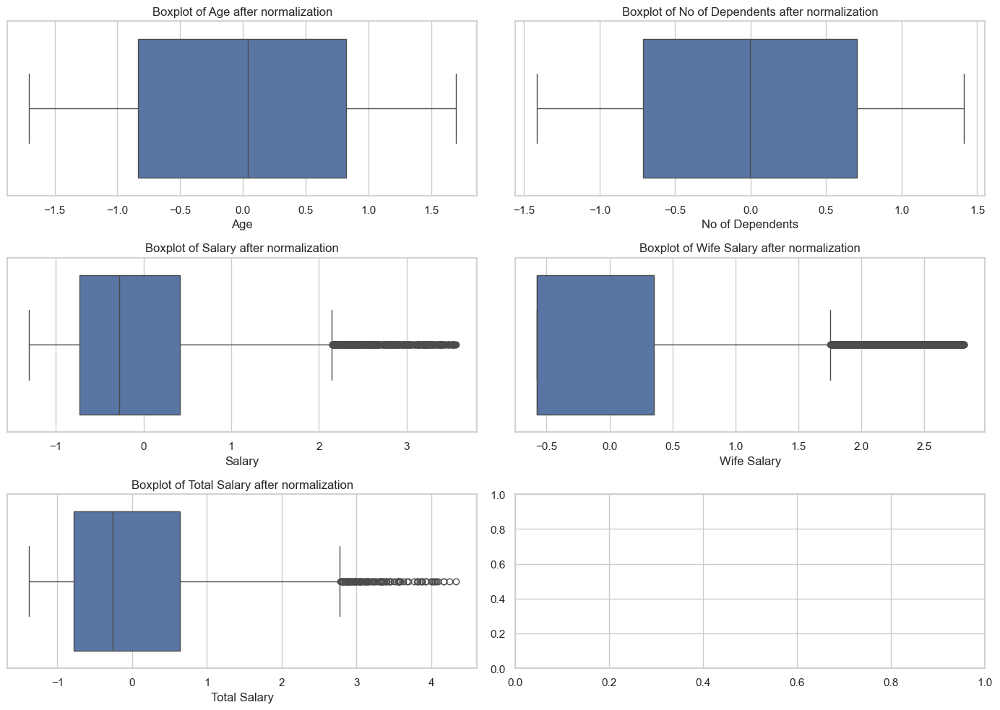

In [44]:
# Plot boxplots for normalized numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 10))
axes = axes.flatten()
for i, col in enumerate(numerical_cols):
    sns.boxplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col} after normalization')
plt.tight_layout()
plt.show()

## Step 5: Applying PCA
We'll reduce the dimensionality using PCA to 2 components and visualize the explained variance.

In [46]:
# Apply PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data)
data_pca_df = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])

In [47]:
data_pca_df

,PC1,PC2
0,-0.523528,0.250451
1,-1.428994,-0.056132
2,-1.503298,-0.151586
3,1.992467,-1.554702
4,-1.140990,-0.013316
...,...,...
9995,-0.022185,1.236324
9996,-1.055085,0.285306
9997,4.107340,1.782347
9998,-1.282314,-0.255496


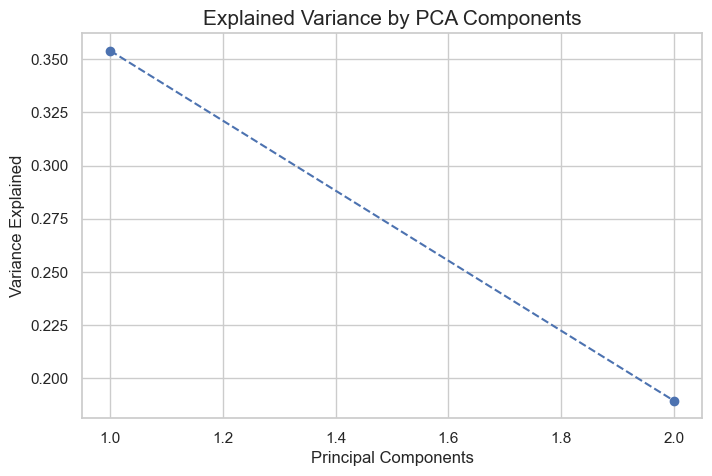

In [48]:
# Explained variance plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, 3), pca.explained_variance_ratio_, marker='o', linestyle='--', color='b')
plt.title('Explained Variance by PCA Components', fontsize=15)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Variance Explained', fontsize=12)
plt.grid(True)
plt.show()

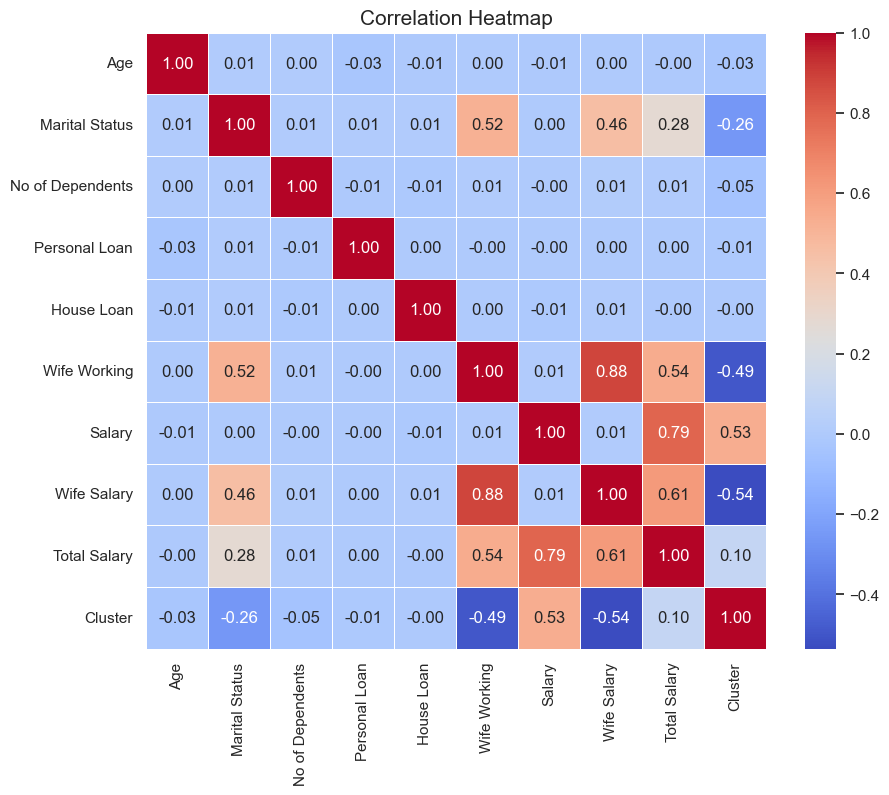

In [78]:
# Compute the correlation matrix
corr_matrix = data.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt=".2f")
plt.title('Correlation Heatmap', fontsize=15)
plt.show()


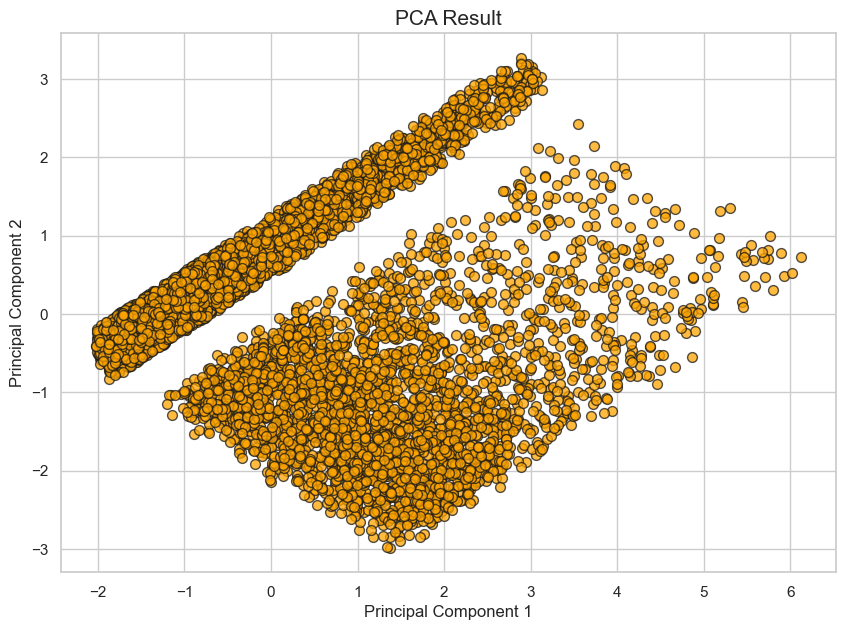

In [49]:
# Scatter plot of PCA result
plt.figure(figsize=(10, 7))
plt.scatter(data_pca_df['PC1'], data_pca_df['PC2'], s=50, c='orange', edgecolors='k', alpha=0.75)
plt.title('PCA Result', fontsize=15)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(True)
plt.show()

## Step 6: Determining the Optimal Number of Clusters
Use the elbow method to find the optimal number of clusters for K-Means.

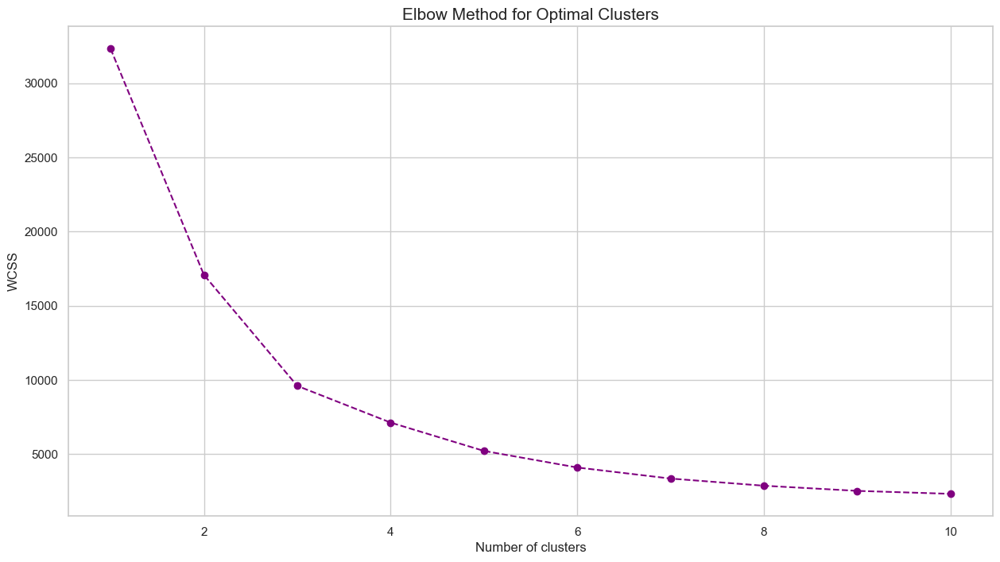

In [52]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_pca_df)
    wcss.append(kmeans.inertia_)

# Plot the elbow method
plt.figure(figsize=(15, 8))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--', color='purple')
plt.title('Elbow Method for Optimal Clusters', fontsize=15)
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('WCSS', fontsize=12)
plt.grid(True)
plt.show()

## Step 7: K-Means Clustering
Apply K-Means clustering with the chosen number of clusters and visualize the clusters.

In [53]:
# Apply K-Means with the chosen number of clusters (e.g., 4 from the elbow plot)
optimal_clusters = 4  # This value should be chosen based on the elbow plot
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
clusters = kmeans.fit_predict(data_pca_df)
data_pca_df['Cluster'] = clusters

In [54]:
# Print the cluster centers
print("\nCluster centers (in PCA space):")
print(kmeans.cluster_centers_)


Cluster centers (in PCA space):
[[ 1.4045479  -1.45173565]
 [-1.15246008 -0.06923603]
 [ 2.63145367  1.53311769]
 [ 0.14742942  0.90542626]]


### Visualization:
Scatter plot of the clusters and centroids.

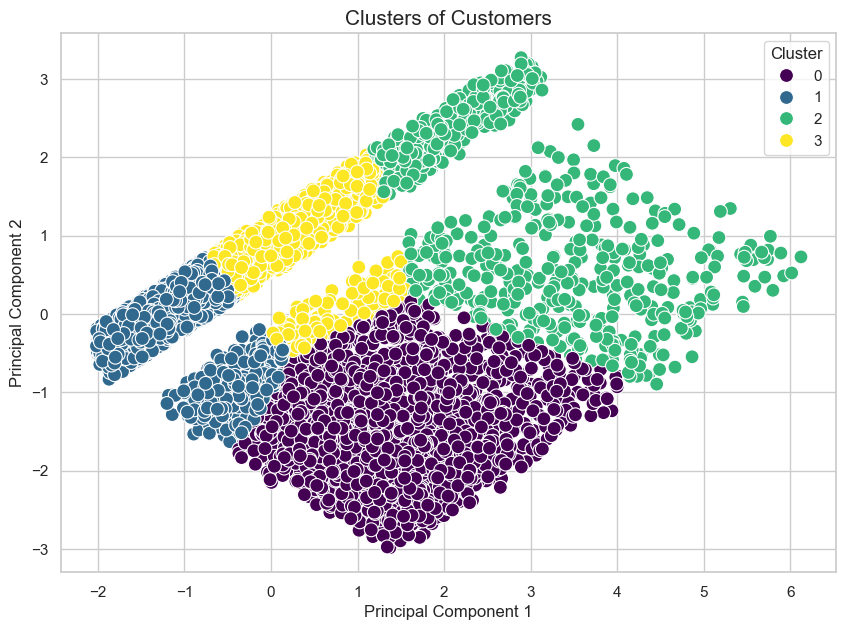

In [55]:
# Plotting the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=data_pca_df, palette='viridis', s=100)
plt.title('Clusters of Customers', fontsize=15)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

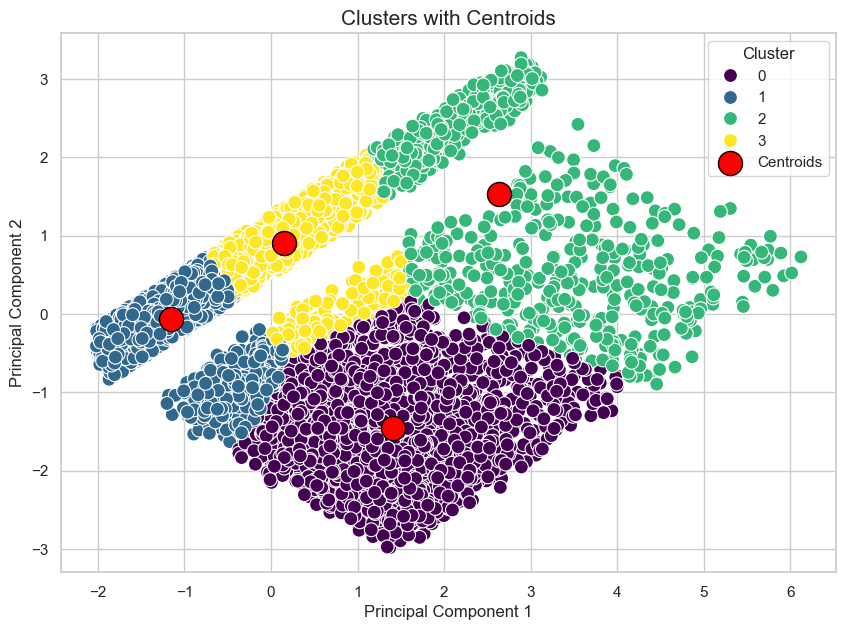

In [56]:
# Extract cluster centroids and sizes
centroids = kmeans.cluster_centers_

# Plotting the cluster centroids
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=data_pca_df, palette='viridis', s=100)
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', label='Centroids', edgecolor='black')
plt.title('Clusters with Centroids', fontsize=15)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

In [57]:
# Calculate the size of each cluster
cluster_sizes = data_pca_df['Cluster'].value_counts().sort_index()
print("\nCluster sizes:")
print(cluster_sizes)



Cluster sizes:
Cluster
0    2066
1    4867
2     915
3    2152
Name: count, dtype: int64


## Step 8: 3D Visualization of Clusters
For a more detailed visualization, plot the clusters in 3D.

In [58]:
# Apply PCA with 3 components
pca_3d = PCA(n_components=3)
data_pca_3d = pca_3d.fit_transform(data)
data_pca_3d_df = pd.DataFrame(data_pca_3d, columns=['PC1', 'PC2', 'PC3'])
data_pca_3d_df['Cluster'] = clusters

In [59]:
data_pca_3d_df

,PC1,PC2,PC3,Cluster
0,-0.523528,0.250451,1.194349,1
1,-1.428994,-0.056132,0.549618,1
2,-1.503298,-0.151586,0.605982,1
3,1.992467,-1.554702,-1.960767,0
4,-1.140990,-0.013316,-0.453394,1
...,...,...,...,...
9995,-0.022185,1.236324,-1.966316,3
9996,-1.055085,0.285306,-0.269728,1
9997,4.107340,1.782347,-1.374297,2
9998,-1.282314,-0.255496,0.608547,1


### 3d with Matploylib

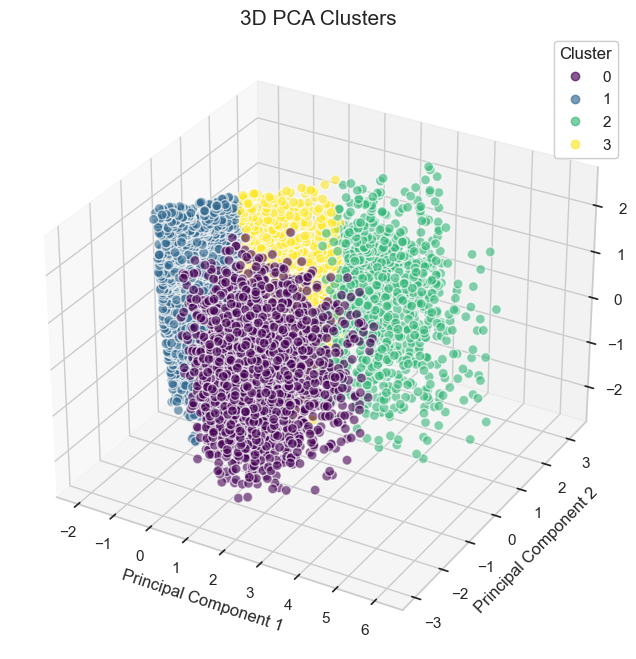

In [60]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(data_pca_3d_df['PC1'], data_pca_3d_df['PC2'], data_pca_3d_df['PC3'], c=data_pca_3d_df['Cluster'], cmap='viridis', s=50, alpha=0.6, edgecolors='w')
ax.set_title('3D PCA Clusters', fontsize=15)
ax.set_xlabel('Principal Component 1', fontsize=12)
ax.set_ylabel('Principal Component 2', fontsize=12)
ax.set_zlabel('Principal Component 3', fontsize=12)
legend = ax.legend(*scatter.legend_elements(), title='Cluster')
ax.add_artist(legend)
plt.show()

### 3d with plotly for clear visualization

In [62]:
# Apply PCA with 3 components
pca_3d = PCA(n_components=3)
data_pca_3d = pca_3d.fit_transform(data)
data_pca_3d_df = pd.DataFrame(data_pca_3d, columns=['PC1', 'PC2', 'PC3'])
data_pca_3d_df['Cluster'] = clusters

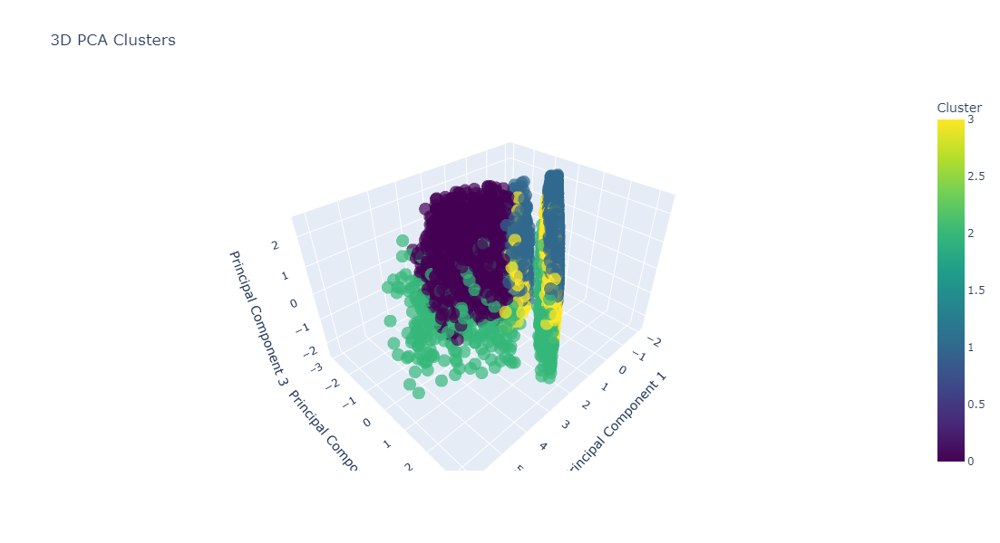

In [63]:
# Create the 3D scatter plot using Plotly Express
fig = px.scatter_3d(data_pca_3d_df, x='PC1', y='PC2', z='PC3', color='Cluster',
                    title='3D PCA Clusters', opacity=0.7, size_max=10,
                    color_continuous_scale='viridis', hover_name='Cluster')

# Update the layout
fig.update_layout(scene=dict(xaxis_title='Principal Component 1',
                             yaxis_title='Principal Component 2',
                             zaxis_title='Principal Component 3'),
                  width=800, height=600)

# Display the plot
fig.show()

## Step 9: Interpretation of Results
Interpreting the results of the clustering and understanding the characteristics of each segment.

In [64]:
# Adding cluster labels to the original data
data['Cluster'] = clusters

In [65]:
# Summary statistics for each cluster
cluster_summary = data.groupby('Cluster').mean()
print("\nCluster Summary (Mean Values):")
print(cluster_summary)


Cluster Summary (Mean Values):
              Age  Marital Status  No of Dependents  Personal Loan  \
Cluster                                                              
0        0.024015        1.000000          0.060942       0.499516   
1        0.019152        0.497432          0.014534       0.503390   
2       -0.037215        0.680874         -0.060981       0.510383   
3       -0.050548        0.487918         -0.065450       0.484201   

         House Loan  Wife Working    Salary  Wife Salary  Total Salary  
Cluster                                                                 
0          0.500484      1.000000 -0.259356     1.657335      0.800750  
1          0.500103      0.086090 -0.616278    -0.510697     -0.796281  
2          0.489617      0.427322  2.310544     0.227240      1.961663  
3          0.498606      0.066914  0.660366    -0.532722      0.198061  


### With matplotlib

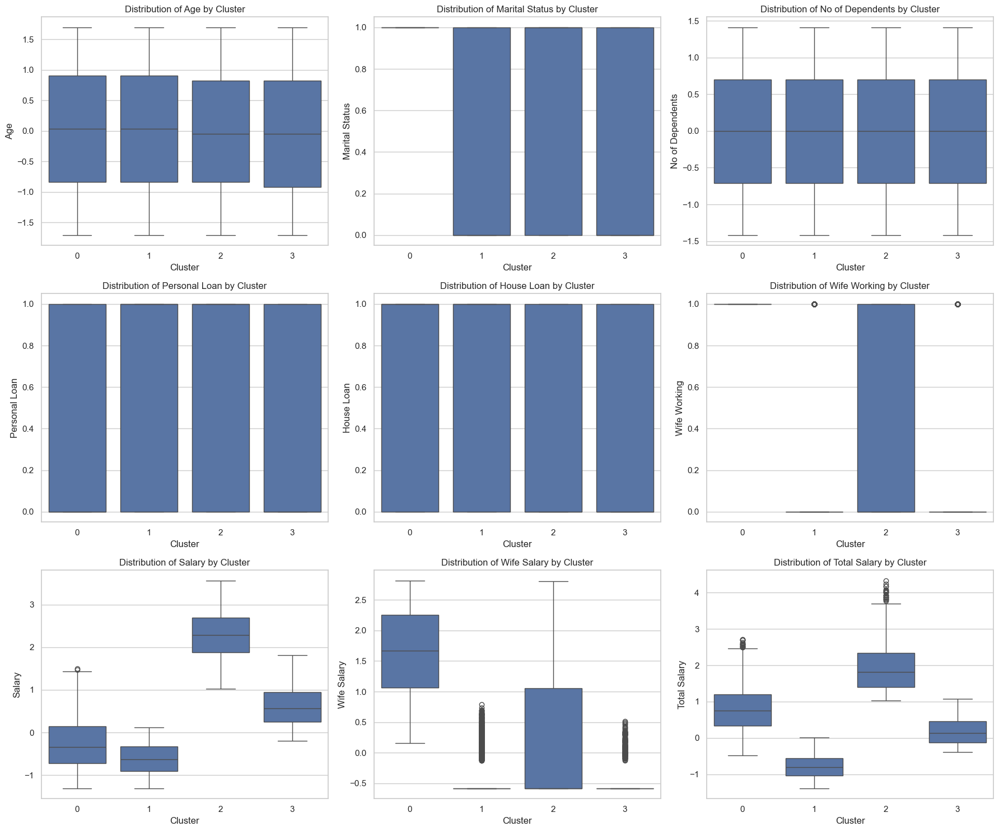

In [66]:
# Visualize the distribution of each variable across clusters
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axes = axes.flatten()
for i, col in enumerate(data.columns[:-1]):  # Exclude the 'Cluster' column
    sns.boxplot(x='Cluster', y=col, data=data, ax=axes[i])
    axes[i].set_title(f'Distribution of {col} by Cluster')
plt.tight_layout()
plt.show()


### With Plotly

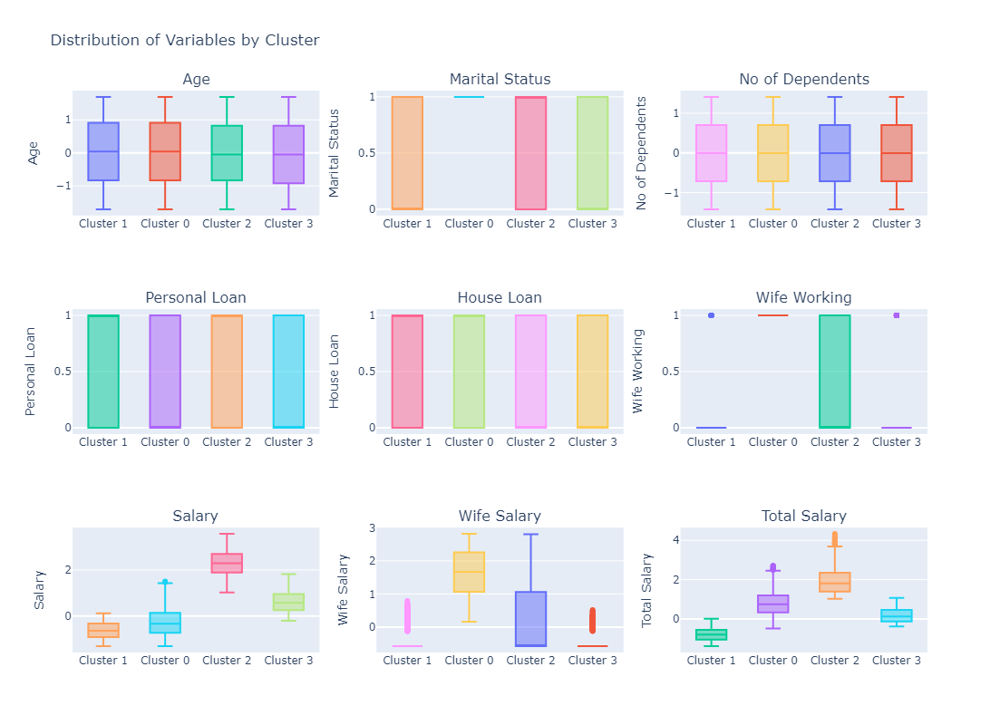

In [67]:
# Create subplots with 3 rows and 3 columns
fig = make_subplots(rows=3, cols=3, subplot_titles=data.columns[:-1])

# Iterate over each variable (excluding the 'Cluster' column)
for i, col in enumerate(data.columns[:-1]):
    row = i // 3 + 1  # Calculate the row index
    col_idx = i % 3 + 1  # Calculate the column index
    
    # Create box plots for each cluster
    for cluster in data['Cluster'].unique():
        trace = go.Box(y=data[data['Cluster'] == cluster][col], name=f'Cluster {cluster}')
        fig.add_trace(trace, row=row, col=col_idx)
    
    # Update the axis title for each subplot
    fig.update_yaxes(title_text=col, row=row, col=col_idx)

# Update the layout
fig.update_layout(title='Distribution of Variables by Cluster', height=800, width=1000,
                  showlegend=False)

# Display the plot
fig.show()